In [1]:
import numpy as np
import ellc
import matplotlib.pyplot as plt

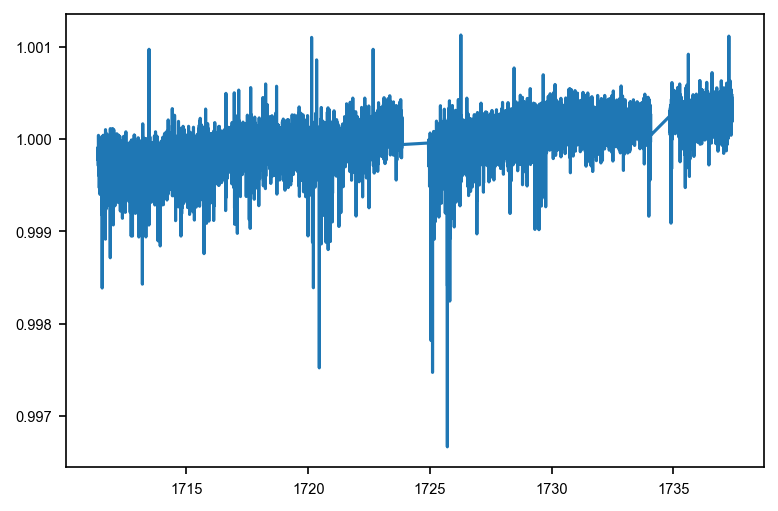

In [63]:
aa = lc_files[1].normalize().remove_nans()
time, flux = aa.time, aa.flux
t0_guess = time[np.argmin(flux)]
spacing = 0.4
mask = (time > t0_guess-spacing) & (time < t0_guess+spacing)
plt.plot(time[~mask], flux[~mask])

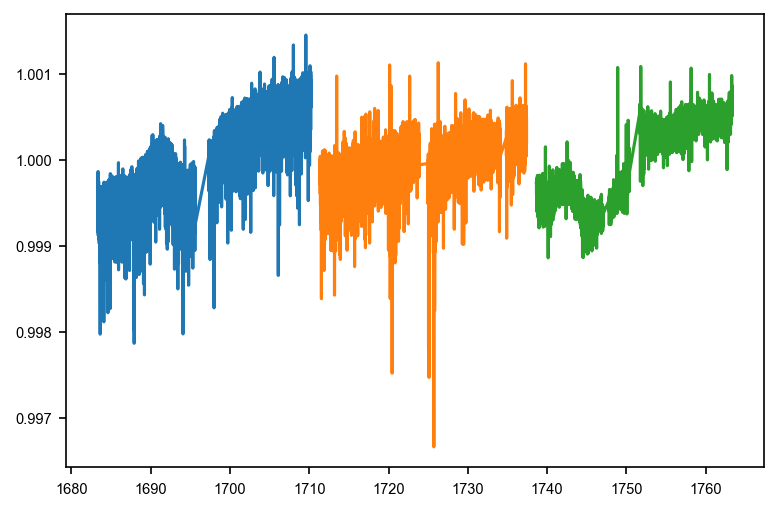

In [64]:
for lc in lc_files:
    lc = lc.normalize().remove_nans()
    time, flux = lc.time, lc.flux
    t0_guess = time[np.argmin(flux)]
    spacing = 0.4
    mask = (time > t0_guess-spacing) & (time < t0_guess+spacing)
    plt.plot(time[~mask], flux[~mask])

In [92]:
from scipy.interpolate import UnivariateSpline

spl = UnivariateSpline(time[~mask], flux[~mask], k=5, s=1)
xs = np.linspace(time[0], time[-1], 1000)


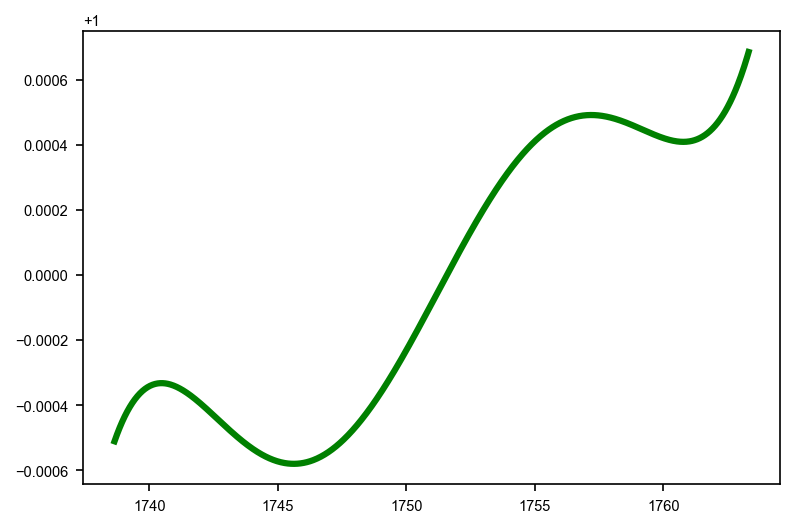

In [93]:
plt.plot(xs, spl(xs), 'g', lw=3)

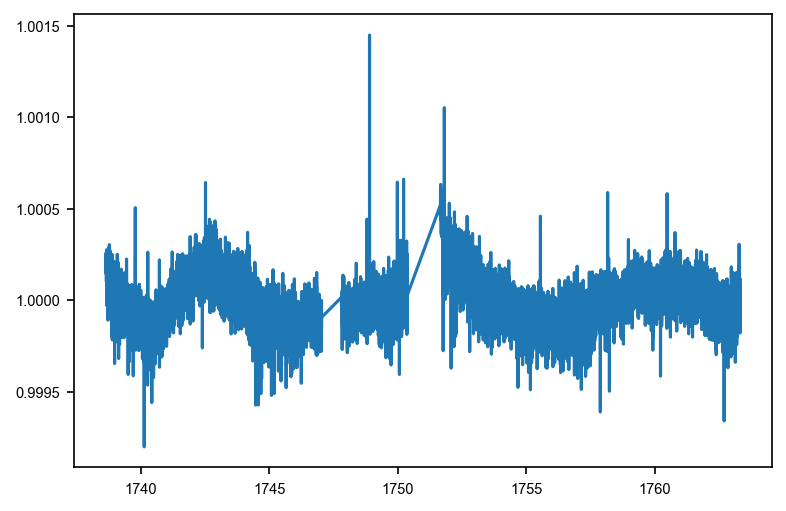

In [95]:
# plt.plot(xs, spl(xs), 'g', lw=3)
plt.plot(time[~mask], flux[~mask]/spl(time[~mask]))
# plt.plot(time[mask], flux[mask])

In [2]:
plt.rcParams['figure.dpi'] = 200

In [3]:
t, y, yerr = np.loadtxt('data/lc.txt', usecols=(0,1,2)).T
# tjd_0 = 2457000
# t += tjd_0
t0_guess = t[np.argmin(y)]

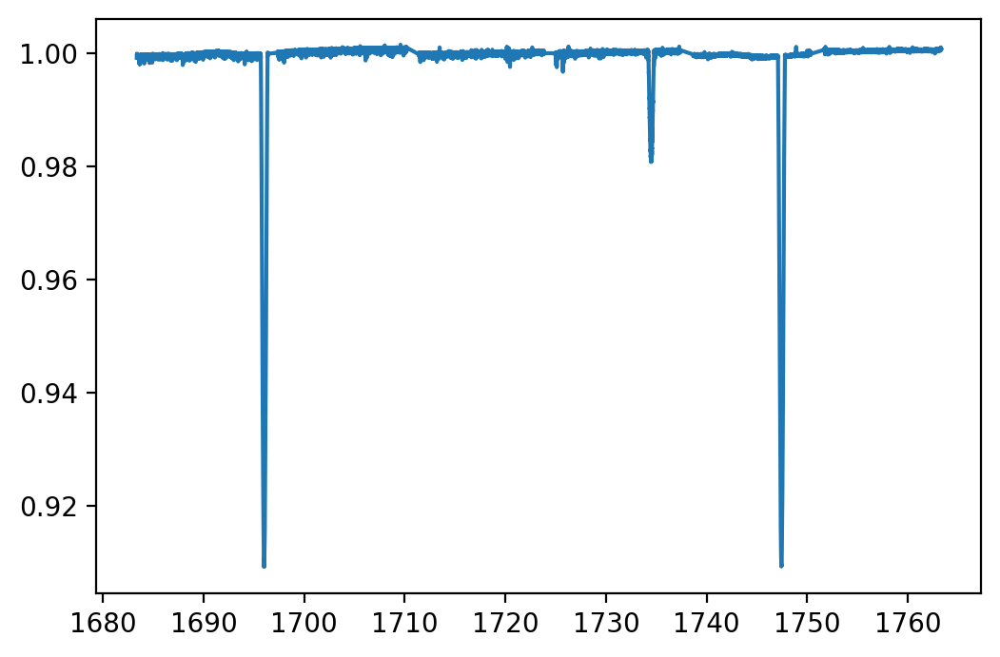

In [5]:
plt.plot(t,y)

In [6]:
%run setup.py

Text(0, 0.5, 'Flux')

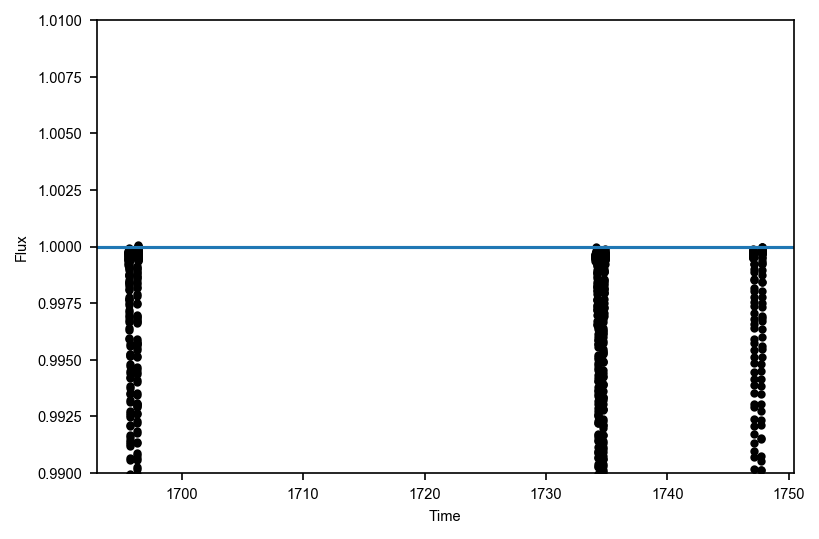

In [7]:
t0_guess = t[np.argmin(y)]

spacing = 0.4

y_transit = y[(t > t0_guess-spacing) & (t < t0_guess+spacing)]
t_transit = t[(t > t0_guess-spacing) & (t < t0_guess+spacing)]
yerr_transit = yerr[(t > t0_guess-spacing) & (t < t0_guess+spacing)]

plt.plot(t_transit, y_transit, '.k')
plt.xlabel('Time')
plt.ylabel('Flux')

t1_guess = t[t>1700][np.argmin(y[t>1700])]
y_transit2 = y[(t > t1_guess-spacing) & (t < t1_guess+spacing)]
t_transit2 = t[(t > t1_guess-spacing) & (t < t1_guess+spacing)]
yerr_transit2 = yerr[(t > t1_guess-spacing) & (t < t1_guess+spacing)]

t2_guess = t[(t>1700) & (t<1740)][np.argmin(y[(t>1700) & (t<1740)])]
y_transit3 = y[(t > t2_guess-spacing) & (t < t2_guess+spacing)]
t_transit3 = t[(t > t2_guess-spacing) & (t < t2_guess+spacing)]
yerr_transit3 = yerr[(t > t2_guess-spacing) & (t < t2_guess+spacing)]

y_transit /= np.max(y_transit)
y_transit2 /= np.max(y_transit2)
y_transit3 /= np.max(y_transit3)

plt.plot(t_transit, y_transit, '.k')
plt.plot(t_transit2, y_transit2, '.k')
plt.plot(t_transit3, y_transit3, '.k')

plt.ylim(0.99,1.01)
plt.axhline(1.)
plt.xlabel('Time')
plt.ylabel('Flux')

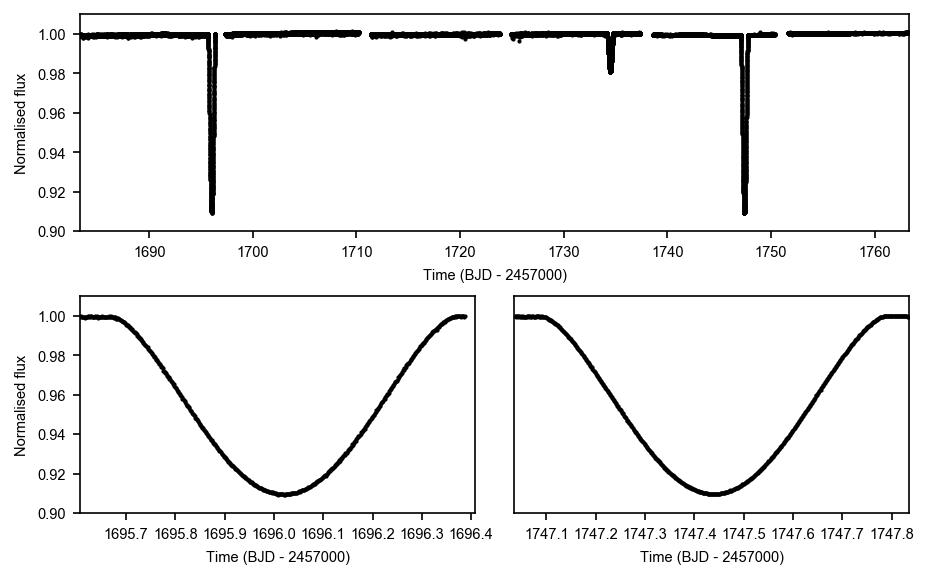

In [8]:
import numpy as np
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=mnras_size(513.11743))


ax1 = plt.subplot(223)
ax1.plot(t_transit, y_transit, '.k', markersize=2, rasterized=True)
ax1.set_xlabel('Time (BJD - 2457000)')
ax1.set_ylabel('Normalised flux')
ax1.set_ylim(0.9, 1.01)
ax1.set_xlim(t0_guess - spacing, t0_guess+spacing)

ax2 = plt.subplot(224)
ax2.plot(t_transit2, y_transit2, '.k', markersize=2, rasterized=True)
ax2.set_yticks([])
ax2.ticklabel_format(useOffset=False)
ax2.set_ylim(0.9, 1.01)
ax2.set_xlim(t1_guess - spacing, t1_guess+spacing)
ax2.set_xlabel('Time (BJD - 2457000)')

ax = plt.subplot(211)
ax.plot(t,y, '.k', markersize=2, rasterized=True)
ax.set_xlim(t[0], t[-1])
ax.set_ylim(0.9, 1.01)

ax.set_xlabel('Time (BJD - 2457000)')
ax.set_ylabel('Normalised flux')
plt.subplots_adjust(hspace=0.3, wspace=0.1)
# plt.savefig('lc_plot.pdf', dpi=300, bbox_inches='tight', pad_inches=0)

In [9]:
full_transit_time, full_transit_flux, full_transit_err = np.hstack([t_transit, t_transit2, t_transit3]), np.hstack([y_transit, y_transit2, y_transit3]), np.hstack([yerr_transit, yerr_transit2, yerr_transit3])

sort = np.argsort(full_transit_time)
full_transit_time = full_transit_time[sort][::20]
full_transit_flux = full_transit_flux[sort][::20]
full_transit_err = full_transit_err[sort][::20]

In [10]:
def q_to_u(q1, q2):
    return 2*np.sqrt(q1)*q2, np.sqrt(q1)*(1 - 2*q2)

def model(params, x):
    period, rsum, rratio, incl, sbratio, t0, f_c, f_s, q11, q12, q21, q22, mean = params
    
    r1, r2 = rsum/(1.+rratio), rsum*rratio/(1.+rratio)
    # Convert to LD
    u11, u12 = q_to_u(q11,q12)
    u21, u22 = q_to_u(q21,q22)
    lc = ellc.lc(x,t_zero=t0, #q=q,
            radius_1=r1, radius_2=r2,
             incl=incl, #hf_1=h1, hf_2=h2,
             sbratio=sbratio, shape_1='sphere', shape_2='sphere', ld_1='quad', ld_2='quad', ldc_1=[u11, u12], 
                 ldc_2=[u21, u22],
             period=period, f_c=f_c, f_s=f_s)
    return lc + mean# / np.max(lc)

def lnprior(params):
    period, rsum, rratio, incl, sbratio, t0, f_c, f_s, q11, q12, q21, q22, mean = params
    r1, r2 = rsum/(1.+rratio), rsum*rratio/(1.+rratio)
    # Check LD1:
    if (0 < q11 < 1) & (0 < q12 < 1) & (0 < q21 < 1) & (0 < q22 < 1) & (70 < incl < 90) & (sbratio < 1.5) & ((t0_guess-1) < t0 < (t0_guess+1)):
        return 0.
    else:
        return -np.inf
    
def lnlike(params, x, y, yerr):
    lp = lnprior(params)
    if not np.isfinite(lp):
        return -np.inf
    try:
        model_flux = model(params, x)
        return -0.5*np.sum((y-model_flux)**2/yerr**2)
    except:
        return -np.inf
    
from scipy.optimize import minimize
nll = lambda *args: -lnlike(*args)

In [11]:
bounds = [
    (50,52),
    (0.01, 0.1),
    (0.1, 0.9),
    (80, 90),
    (0.1, 0.99),
    (t0_guess-1, t0_guess+1),
    (f_c-0.1, f_c+0.1),
    (f_s-0.1, f_s+0.1),
    (0,1),
    (0,1),
    (0,1),
    (0,1),
    (-0.5,0.5)
]

NameError: name 'f_c' is not defined

(1733.4655006398082, 1735.4655006398082)

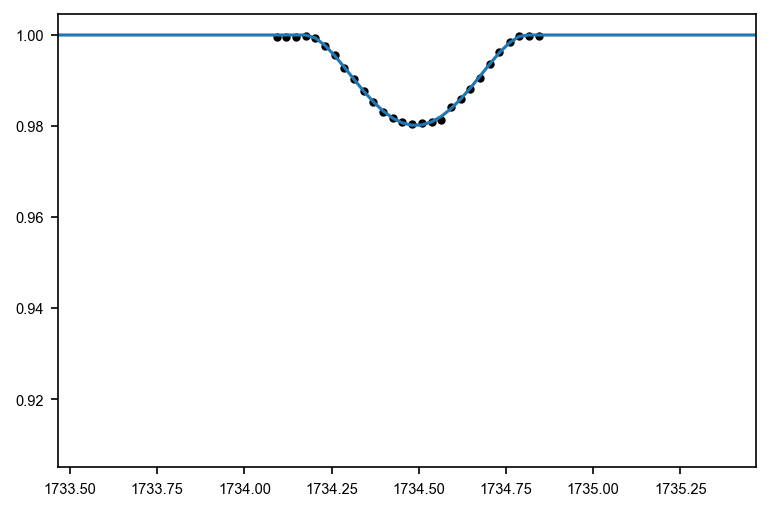

In [12]:
f_c, f_s = 0.6071025773236461, 0.24107770657401392, 

u11, u12, u21, u22 = 0., 0.2884, 0., 0.
#     period, rsum, rratio, incl, sbratio, t0, f_c, f_s, q11, q12, q21, q22 = params

params = np.array([
    5.14192040e+01, # Period
    7.17949071e-02, # Rsum
    6.28722905e-01, # Rratio
    8.62150418e+01, # Incl
    6.91829286e-01, # Sbratio
    1.69601971e+03, # t0
    6.20730605e-01, # fc
    1.60481296e-01, # fs
    2.68060970e-01, # q11
    4.55712020e-01, # q12
    8.30538026e-01, # q21
    5.82431661e-02, # q22
    0.              # Mean
])
lc =model(params, full_transit_time)

plt.plot(full_transit_time,full_transit_flux, '.k')
plt.plot(full_transit_time, lc)
plt.xlim(t2_guess-1, t2_guess+1)

In [26]:
from scipy.optimize import differential_evolution

soln = differential_evolution(nll, bounds, args=(full_transit_time, full_transit_flux, full_transit_err))

In [31]:
soln

     fun: 1093.5873910950008
 message: 'Optimization terminated successfully.'
    nfev: 183537
     nit: 940
 success: True
       x: array([ 5.14193350e+01,  6.97824181e-02,  4.48640319e-01,  8.64215072e+01,
        9.21240617e-01,  1.69601955e+03,  6.07803185e-01,  2.32539022e-01,
        1.43761520e-01,  7.41404986e-01,  6.74038265e-01,  8.38980279e-03,
       -3.24613112e-04])

In [37]:
# #plt.plot(full_transit_time, model(params, full_transit_time))
# soln = minimize(nll, params, args=(full_transit_time, full_transit_flux, full_transit_err), 
# #                 method='Nelder-Mead', tol=100
#                )

In [27]:
soln.x

array([ 5.14193350e+01,  6.97824181e-02,  4.48640319e-01,  8.64215072e+01,
        9.21240617e-01,  1.69601955e+03,  6.07803185e-01,  2.32539022e-01,
        1.43761520e-01,  7.41404986e-01,  6.74038265e-01,  8.38980279e-03,
       -3.24613112e-04])

(1695.007457617823, 1697.007457617823)

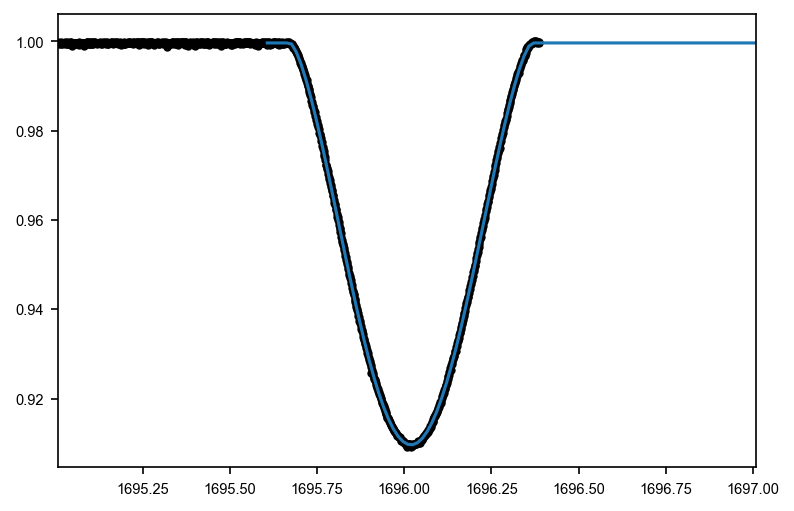

In [32]:
flux = model(soln['x'], full_transit_time)
plt.plot(t,y, '.k')
plt.plot(full_transit_time, flux)
plt.xlim(t0_guess-1, t0_guess+1)

(1733.4655006398082, 1735.4655006398082)

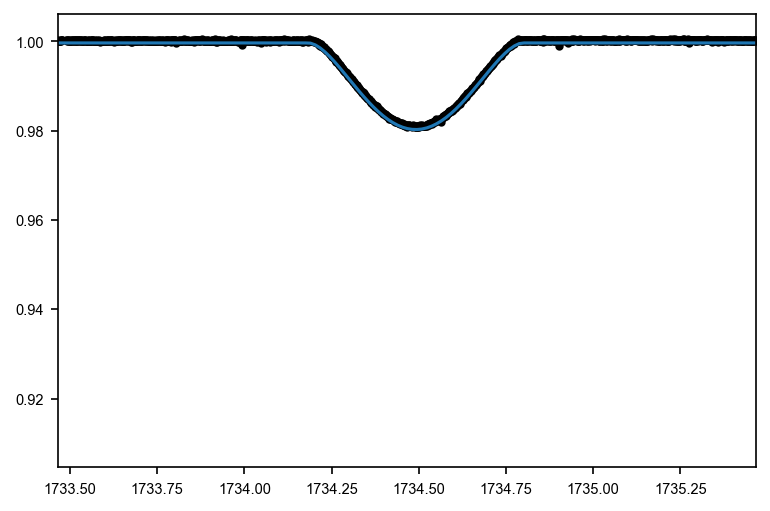

In [33]:
flux = model(soln['x'], full_transit_time)
plt.plot(t,y, '.k')
plt.plot(full_transit_time, flux)
plt.xlim(t2_guess-1, t2_guess+1)

In [58]:
import emcee

pos = soln.x + 1e-4*np.random.randn(32, len(soln.x))
nwalkers, ndim = pos.shape

sampler = emcee.EnsembleSampler(nwalkers, ndim, lnlike, args=(full_transit_time, full_transit_flux, full_transit_err))
sampler.run_mcmc(pos, 10000, progress=True);

/Users/danielhey/anaconda3/envs/phoebe/lib/python3.7/site-packages/emcee/ensemble.py:258: RuntimeWarning: Initial state is not linearly independent and it will not allow a full exploration of parameter space
  category=RuntimeWarning,
100%|██████████| 10000/10000 [15:14<00:00, 10.93it/s]


In [59]:
discard = 5000
flat_samples = sampler.get_chain(discard=discard,)
#                                  flat=True)

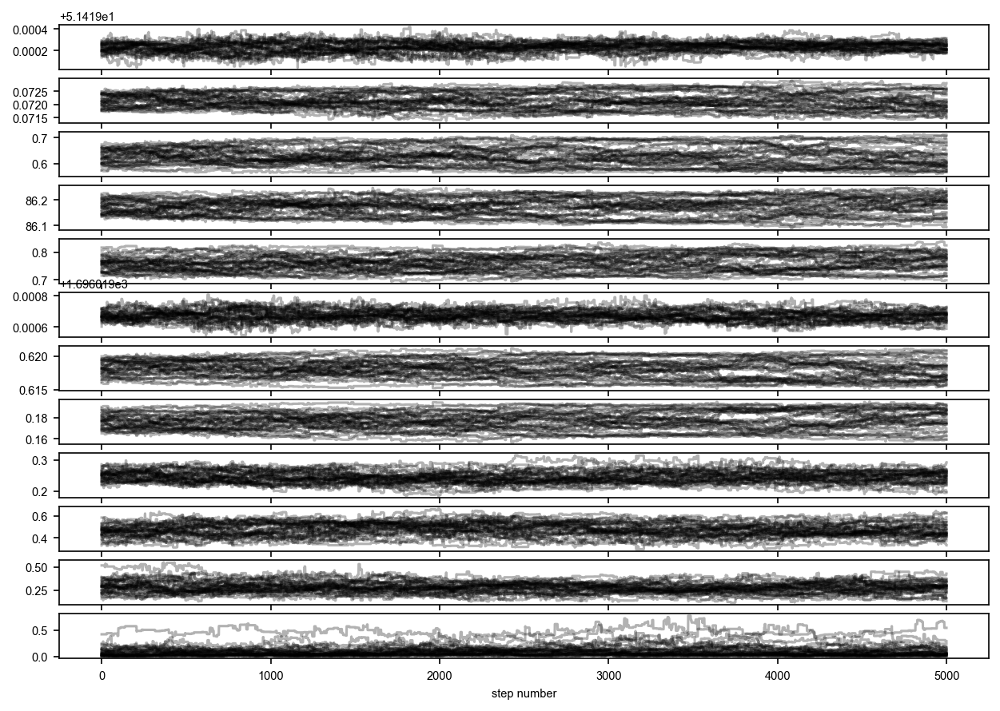

In [60]:
fig, axes = plt.subplots(len(flat_samples.T), figsize=(10, 7), sharex=True)
# samples = sampler.get_chain()
for i in range(ndim):
    ax = axes[i]
    ax.plot(flat_samples[:, :, i], "k", alpha=0.3)
#     ax.set_xlim(0, len(samples))
    ax.yaxis.set_label_coords(-0.1, 0.5)

axes[-1].set_xlabel("step number");

In [61]:
flat_samples = sampler.get_chain(discard=discard,flat=True)

# rsum, rratio, incl, sbratio, t0, f_c, f_s = params

In [62]:
eccen, omega = flat_samples[:,7]**2 + flat_samples[:,6]**2, np.arctan(flat_samples[:,7] / flat_samples[:,6])

In [63]:
full_trace = np.hstack([flat_samples[:,0:6],eccen[:,None], omega[:,None], flat_samples[:,8:]])

In [64]:
len(full_trace.T)

12

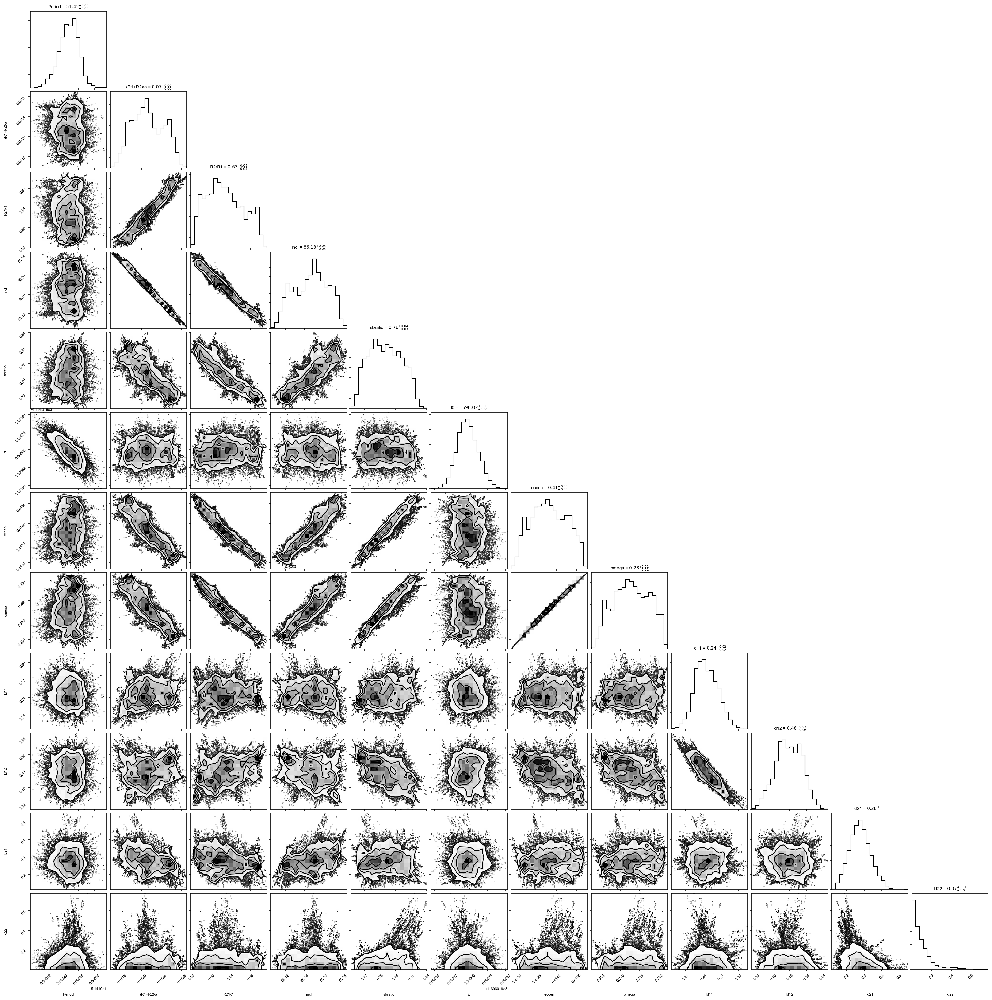

In [65]:
import corner
# flat_samples = sampler.get_chain(flat=True)
#incl, r1, r2, sbratio, q
corner.corner(full_trace, 
              labels=['Period', '(R1+R2)/a', 'R2/R1', 'incl', 'sbratio', 't0', 'eccen', 'omega', 'ld11', 'ld12', 'ld21', 'ld22'], show_titles=True, smooth=0.3
             );
# plt.savefig('ellc_fit.png', dpi=300)

In [14]:
rsum, rratio = np.median(flat_samples[:,1]), np.median(flat_samples[:,2])

rsum/(1.+rratio), rsum*rratio/(1.+rratio)

NameError: name 'flat_samples' is not defined

NameError: name 'rsum' is not defined

In [2]:
import numpy as np
0.038 * 43 / np.sin(np.degrees(86))

1.6528168680735897

In [67]:
rsum*rratio/(1.+rratio) * 43 / np.sin(np.degrees(86))

0.9485902020450477

In [66]:
params = ['Period', '(R1+R2)/a', 'R2/R1', 'incl', 'sbratio', 't0', 'eccen', 'omega']
# fits = np.percentile(full_trace, axis=0, q=[15.83, 50, 84.16])
for param, i in zip(params, full_trace.T):
#     vals = (np.percentile(i, axis=0, q=[15.83, 50, 84.16]))
#     print('{}, {:.4f}+{:.4f}-{:.4f}'.format(param, vals[1], vals[1] - vals[0], vals[2] - vals[1]))
    mean = np.mean(i, axis=0)
    sd = np.std(i, axis=0)
    print(f'{param}, {mean:.5f}, {sd:.5f}')

Period, 51.41923, 0.00005
(R1+R2)/a, 0.07213, 0.00031
R2/R1, 0.62877, 0.03670
incl, 86.17310, 0.03453
sbratio, 0.76078, 0.03075
t0, 1696.01967, 0.00004
eccen, 0.41346, 0.00132
omega, 0.27860, 0.01339


In [15]:
rsum = 0.07213
rratio = 0.62877

rsum*rratio/(1.+rratio) * 43 / np.sin(np.degrees(86))

1.2111254293288067

In [121]:
full_transit_time, full_transit_flux, full_transit_err = np.hstack([t_transit, t_transit2, t_transit3]), np.hstack([y_transit, y_transit2, y_transit3]), np.hstack([yerr_transit, yerr_transit2, yerr_transit3])

(1746.4350676780027, 1748.4350676780027)

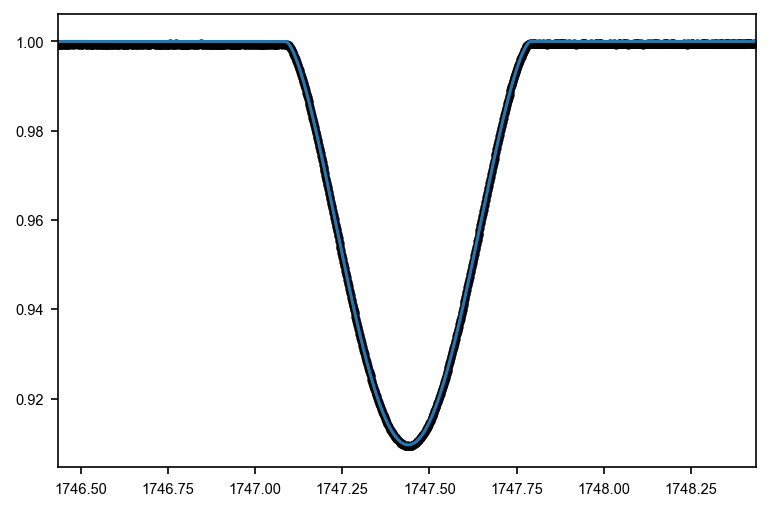

In [81]:


lc =model(np.median(flat_samples, axis=0), t)

plt.plot(t,y, '.k')
plt.plot(t, lc)
plt.xlim(t1_guess-1, t1_guess+1)

# Dynesty

In [75]:
7.17949071e-02

0.0717949071

In [16]:


bounds = [
    (40,60),
    (0.01, 0.5),
    (0.1, 5),
    (80, 100),
    (0.1, 5),
    (t0_guess-5, t0_guess+5),
    (f_c-0.2, f_c+0.2),
    (f_s-0.2, f_s+0.2),
    (0,1),
    (0,1),
    (0,1),
    (0,1),
    (-0.5,0.5)
]

bounds = [
    (50,52),
    (0.01, 0.1),
    (0.1, 0.9),
    (80, 90),
    (0.1, 0.99),
    (t0_guess-1, t0_guess+1),
    (f_c-0.1, f_c+0.1),
    (f_s-0.1, f_s+0.1),
    (0,1),
    (0,1),
    (0,1),
    (0,1),
    (-0.5,0.5)
]

In [17]:
def lnlike2(params, x, y, yerr):
    try:
        model_flux = model(params, x)
        return -0.5*np.sum((y-model_flux)**2/yerr**2)
    except:
        return -np.inf

In [69]:
lnlike2(prior_transform(np.random.uniform(0,1, size=13)), full_transit_time, full_transit_flux, full_transit_err)

-3520789207.7626185

In [19]:
def prior_transform(u):
    """Transforms the uniform random variable `u ~ Unif[0., 1.)`
    to the parameter of interest `x ~ Unif[-10., 10.)`."""
    x = np.array(u)
    for i,bound in enumerate(bounds):
        x[i] = (bound[1] - bound[0])*u[i] + bound[0]

    return x

In [70]:
from dynesty import NestedSampler

# initialize our nested sampler
sampler = NestedSampler(lnlike2, prior_transform, 13, nlive=1000, bound='multi',
                        logl_args=[full_transit_time, full_transit_flux, full_transit_err]
                       )

In [71]:
sampler.run_nested(maxiter=10000)

2635it [00:31, 22.45it/s, bound: 0 | nc: 52 | ncall: 14373 | eff(%): 18.333 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/-  0.143 | dlogz:    inf >  1.009]Traceback (most recent call last):
  File "/Users/danielhey/anaconda3/envs/phoebe/lib/python3.7/site-packages/dynesty/dynesty.py", line 860, in __call__
    return self.func(x, *self.args, **self.kwargs)
KeyboardInterrupt
2637it [00:32, 82.31it/s, bound: 0 | nc: 14 | ncall: 14388 | eff(%): 18.328 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/-  0.144 | dlogz:    inf >  1.009]

Exception while calling prior_transform function:
  params: [0.08804512 0.3496659  0.86501973 0.71989725 0.97383946 0.57243647
 0.04469057 0.69565431 0.28395994 0.98758966 0.68685551 0.09790569
 0.78069976]
  args: []
  kwargs: {}
  exception:


KeyboardInterrupt: 

In [25]:
res = sampler.results['samples']

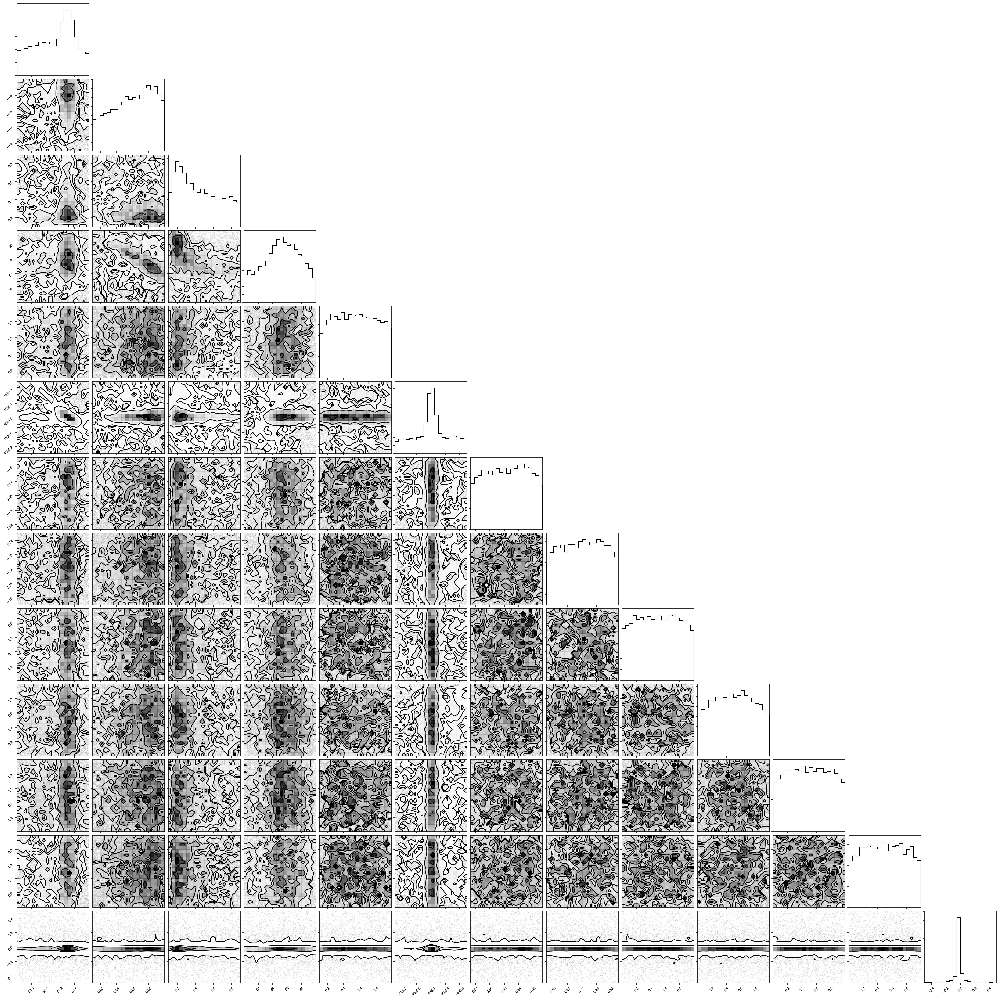

In [31]:
import corner

corner.corner(res);

In [26]:
from dynesty import plotting as dyplot

fig, axes = dyplot.traceplot(res)

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [23]:
dyplot.cornerpoints(sampler.results);

LinAlgError: singular matrix